In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

plt.style.use("seaborn-whitegrid")

In [2]:
# reshape x
#x_true = x_true.reshape(-1,1)

# radial basis function kernel
def rbf_kernel(x1, x2, var, lscale):
    if x2 is None:
        d = cdist(x1, x1)
    else:
        d = cdist(x1, x2)
    K = var*np.exp(-np.power(d,2)/(lscale**2))
    return K

# periodic kernel
def periodic_kernel(x1, x2, var, period, lscale):
    if x2 is None:
        d = cdist(x1,x1)
    else:
        d = cdist(x1,x2)
    return var*np.exp(-(2*np.sin((np.pi/period)*np.sqrt(d))**2)/lscale**2)

# noise kernel
def white_kernel(x1, x2, var):
    if x2 is None:
        return var*np.eye(x1.shape[0])
    else:
        return np.zeros(x1.shape[0], x2.shape[0])
    
# our prediction function
def gp_prediction(x, y, x_true, lscale, var, period=None, rbf=True):
    
    if rbf:
        k_starX = rbf_kernel(x_true, x, var, lscale)
        k_xx = rbf_kernel(x, None, var, lscale)
        k_starstar = rbf_kernel(x_true, None, var, lscale)
    
        mu = k_starX.dot(np.linalg.inv(k_xx)).dot(y).flatten()
        var = k_starstar - k_starX.dot(np.linalg.inv(k_xx)).dot(k_starX.T)
        return mu, var
    
    else:
        k_starX = periodic_kernel(x_true, x, var, period, lscale)
        k_xx = periodic_kernel(x, None, var, period, lscale)
        k_starstar = periodic_kernel(x_true, None, var, period, lscale)
    
        mu = k_starX.dot(np.linalg.inv(k_xx)).dot(y).flatten()
        var = k_starstar - k_starX.dot(np.linalg.inv(k_xx)).dot(k_starX.T)
        return mu, var

In [3]:
# colours
point_c = "#f77f00"

In [4]:
# some function
x = np.linspace(-6,6,100)
y = x**3 - 9*x + np.exp(x**3/30)

In [5]:
samp_index = np.random.randint((len(x)-1)/4, high=(len(x)-1)*3/4, size=5)
x_samp = x[samp_index]
y_samp = y[samp_index]

Text(0, 0.5, 'f(x)')

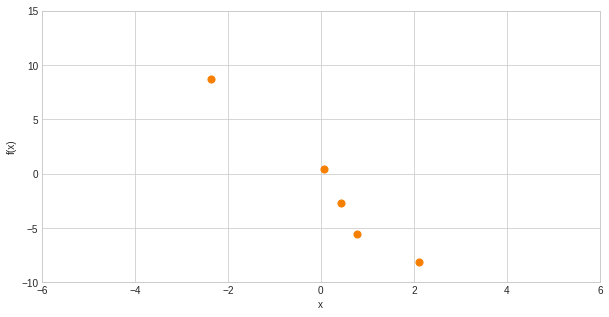

In [7]:
# plot predictions
fig, ax = plt.subplots(figsize=(10,5))
#plt.scatter(x, y, 100, 'k', 'o', zorder=100)
ax.scatter(x_samp, y_samp, s=50, c=point_c, zorder=10)
ax.set_xlim([-6,6])
ax.set_ylim([-10,15])
ax.set_xlabel("x")
ax.set_ylabel("f(x)")
#fig.savefig("Desktop/data", dpi=300, bbox_inches="tight")

In [8]:
K_rbf = rbf_kernel(x.reshape(-1,1), None, 1.0, 2.0)
mu = np.zeros(x.shape[0])
f_rbf = np.random.multivariate_normal(mu, K_rbf, 100)

In [10]:
np.random.multivariate_normal(np.zeros(samp_index.shape[0]), rbf_kernel(samp_index.reshape(-1,1), None, 1.0, 2.0), 1)

array([[-1.73191284, -0.1529799 , -0.02127463, -1.64859456, -0.77289018]])

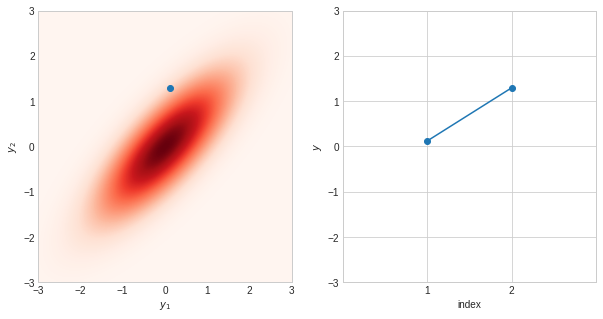

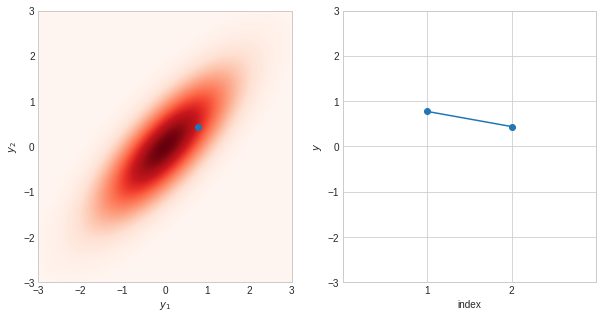

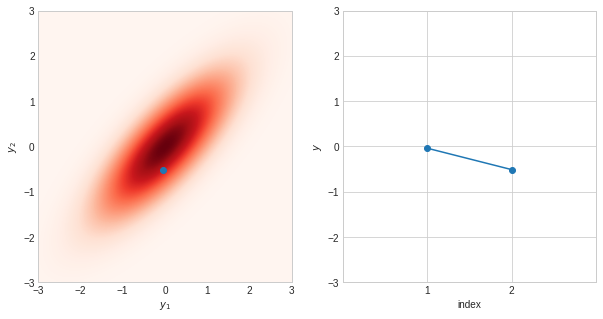

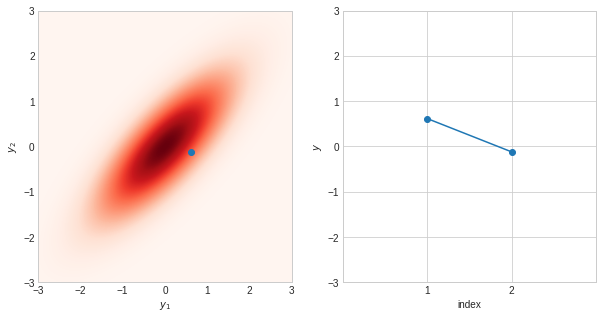

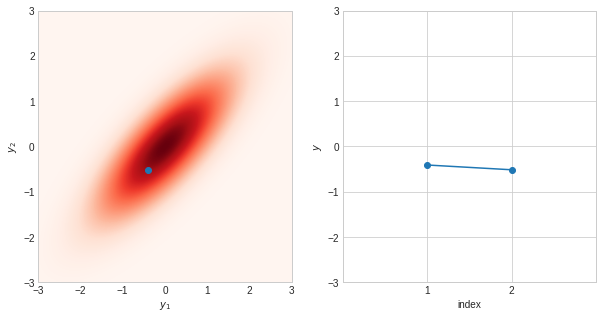

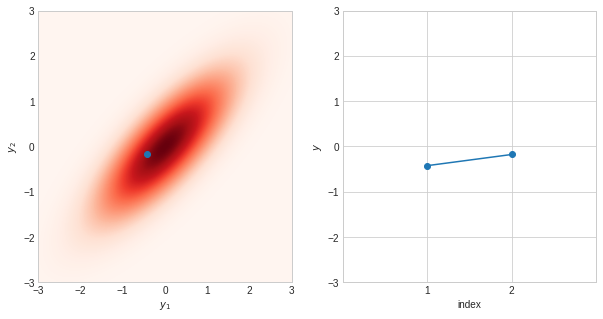

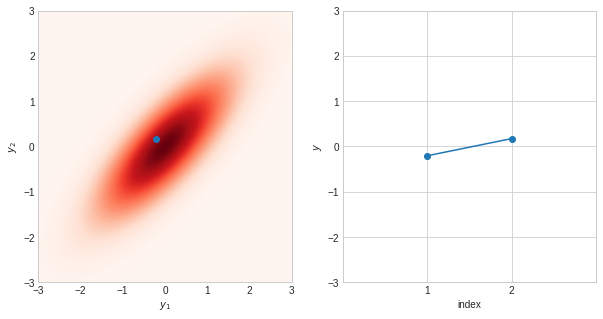

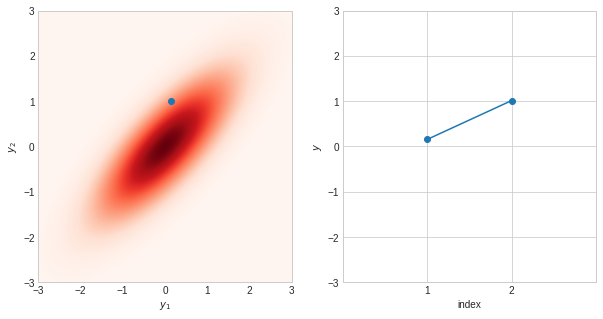

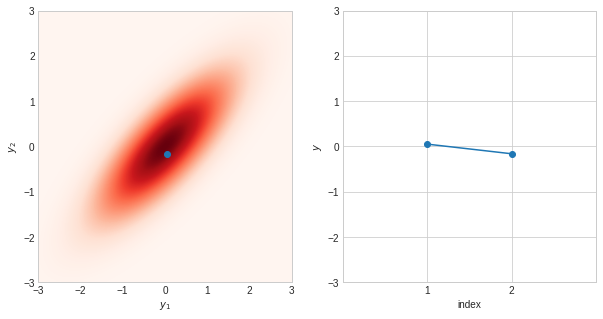

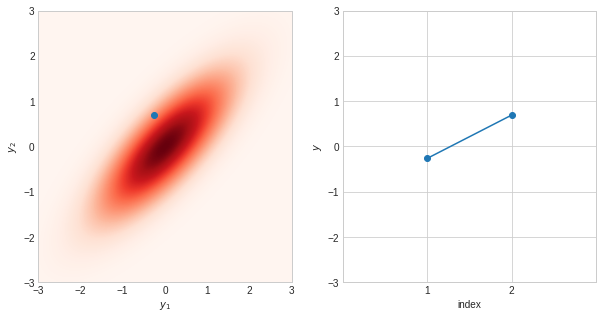

In [12]:
from scipy.stats import multivariate_normal

rv = multivariate_normal(np.zeros(2), rbf_kernel(np.arange(0,2).reshape(-1,1), None, 1.0, 2.0))

#Create grid and multivariate normal
a = np.linspace(-3,3,500)
b = np.linspace(-3,3,500)
X, Y = np.meshgrid(a,b)
pos = np.empty(X.shape + (2,))
pos[:, :, 0] = X; pos[:, :, 1] = Y



for index in range(10):
    grid = plt.GridSpec(1, 2, wspace=0.2, hspace=0.3)
    fig = plt.figure(figsize=(10, 5))

    #plt.subplot(grid[0, 1:])
    ax1 = fig.add_subplot(grid[0, 0])
    ax2 = fig.add_subplot(grid[0, 1])

    ax1.contourf(X, Y, rv.pdf(pos), cmap="Reds", levels=300)
    rand_y1, rand_y2 = np.random.multivariate_normal(np.zeros(2), rbf_kernel(np.arange(0,2).reshape(-1,1), None, 1.0, 2.0), 1)[0]
    ax1.scatter(rand_y1, rand_y2)
    ax1.set_xlabel("$y_1$")
    ax1.set_ylabel("$y_2$")

    ax2.plot(np.arange(1,3), [rand_y1, rand_y2], '-o')
    ax2.set_xlim([0,3])
    ax2.set_ylim([-3,3])
    ax2.set_xlabel("index")
    ax2.set_ylabel("$y$")
    ax2.set_xticks([1,2])
    #fig.savefig(f"Desktop/mn_{index}", dpi=300, bbox_inches="tight")

In [13]:
rbf_kernel(np.arange(0,2).reshape(-1,1), None, 1.0, 2.0)

array([[1.        , 0.77880078],
       [0.77880078, 1.        ]])

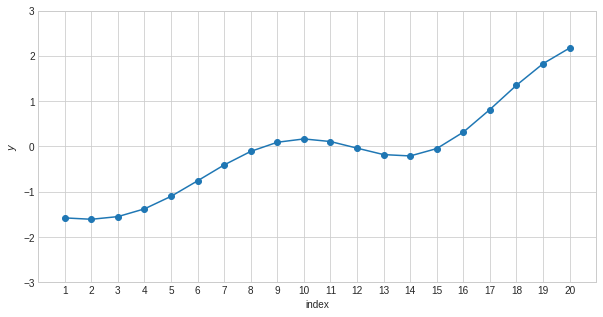

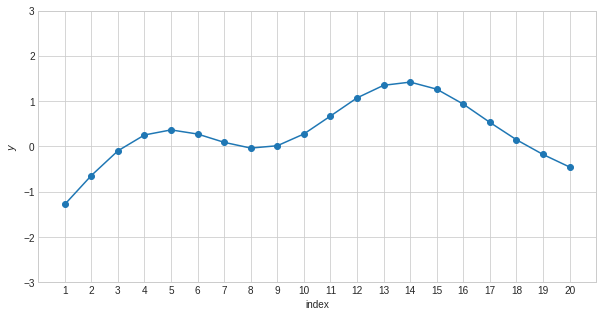

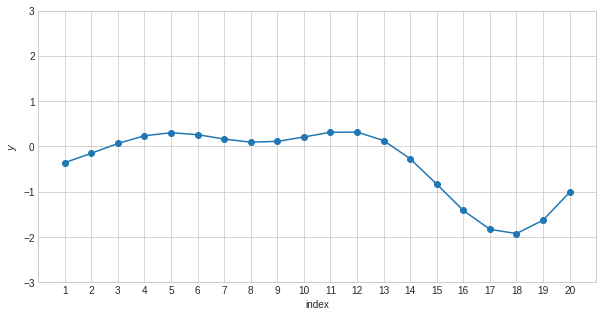

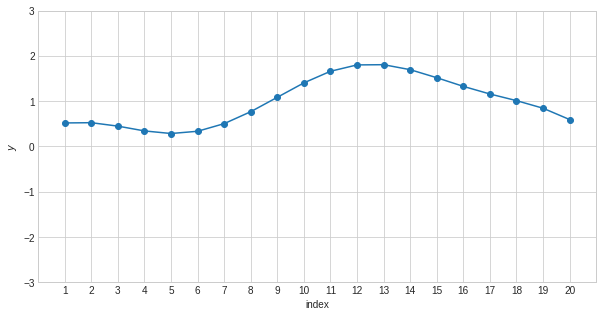

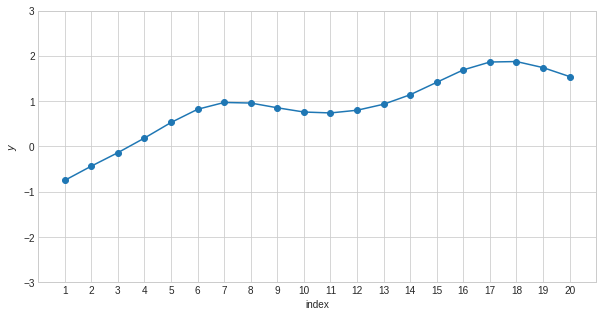

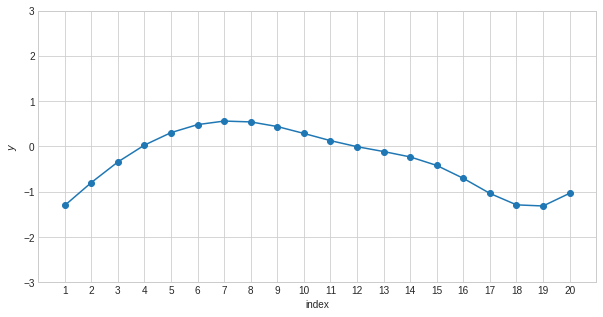

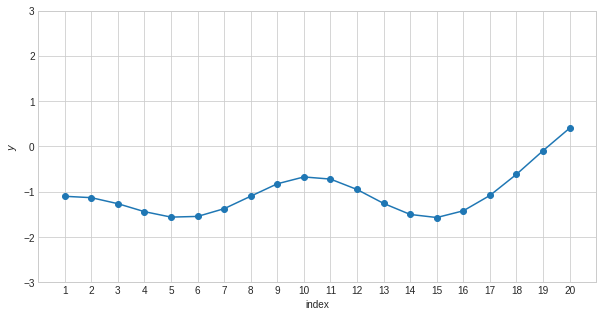

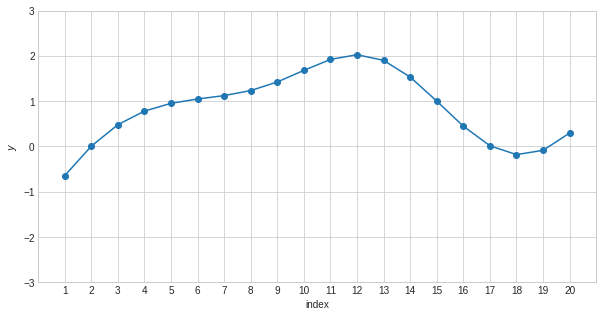

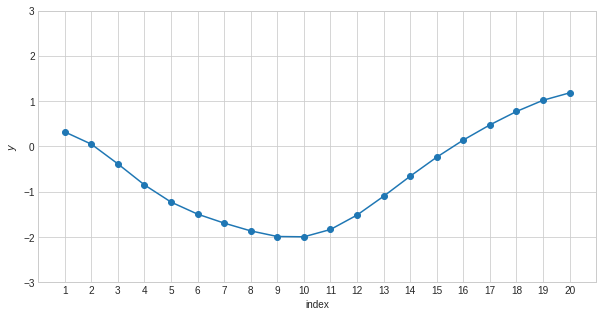

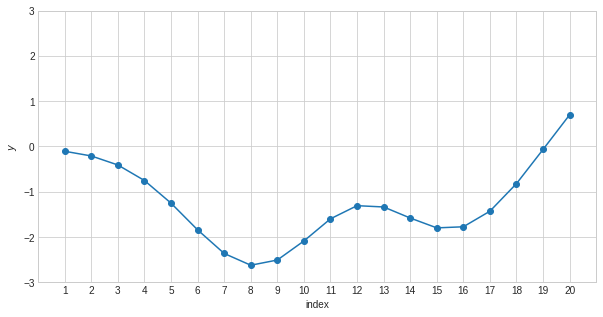

In [15]:
for index in range(10):
    var_index = np.arange(1, 21)
    fig, ax = plt.subplots(figsize=(10,5))
    ax.plot(var_index, np.random.multivariate_normal(np.zeros(var_index.shape[0]), rbf_kernel(var_index.reshape(-1,1), None, 1.0, 5.0), 1)[0], '-o')
    ax.set_xlim(0,21)
    ax.set_ylim(-3,3)
    ax.set_xlabel("index")
    ax.set_ylabel("$y$")
    ax.set_xticks(var_index)
    #fig.savefig(f"Desktop/mn_20_{index}", dpi=300, bbox_inches="tight")

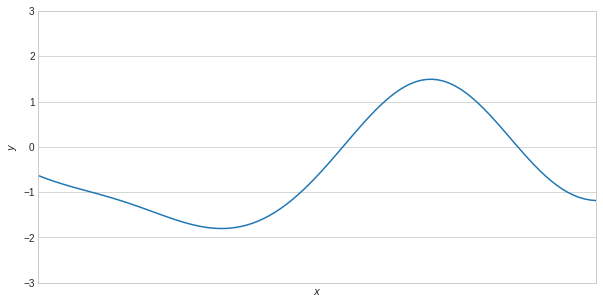

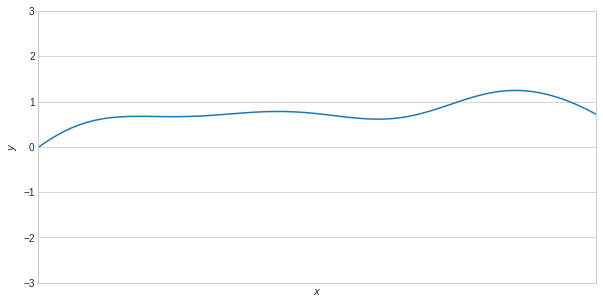

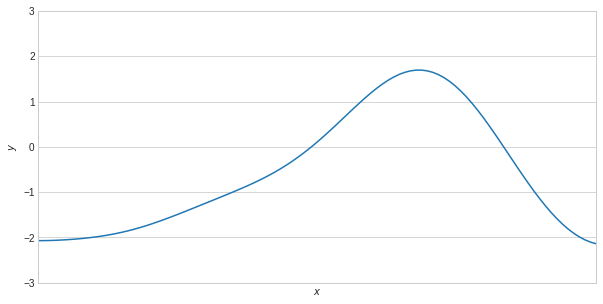

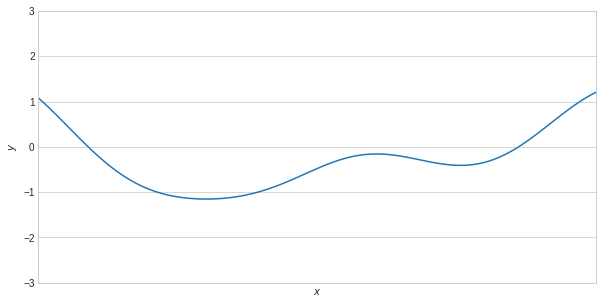

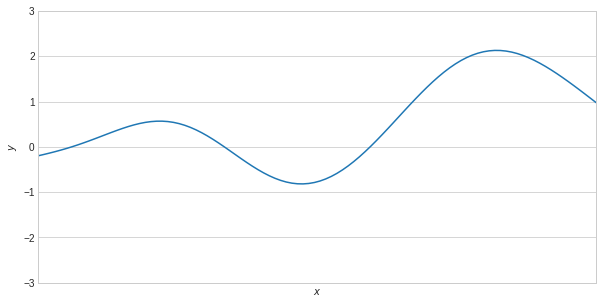

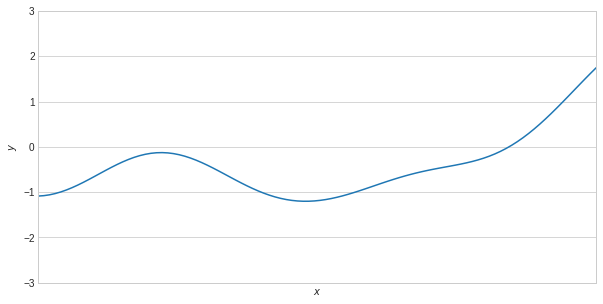

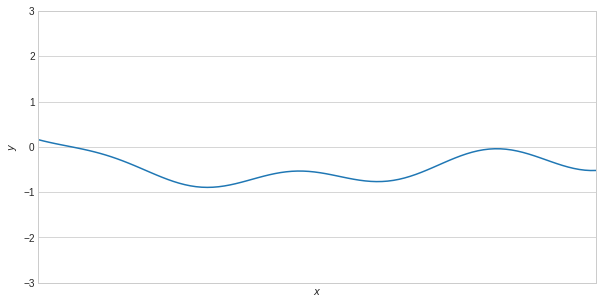

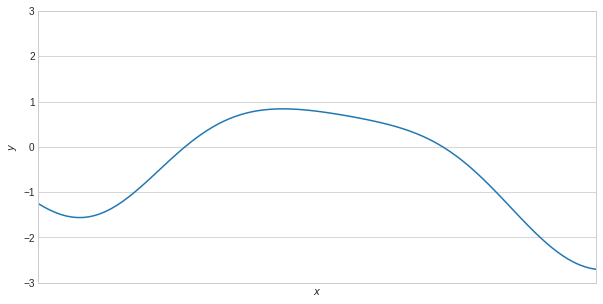

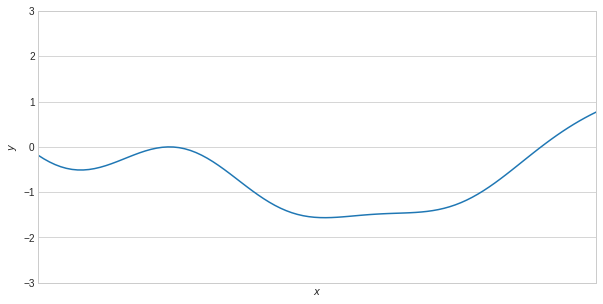

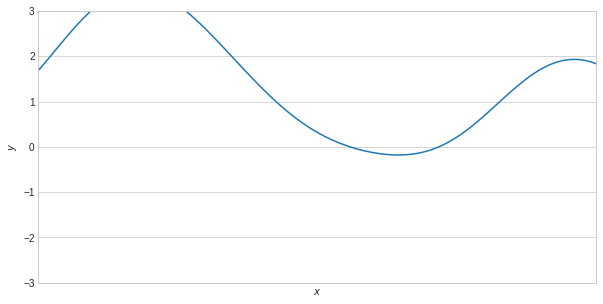

In [16]:
for index in range(10):
    var_index = np.linspace(0, 20,100)
    fig, ax = plt.subplots(figsize=(10,5))
    ax.plot(var_index, np.random.multivariate_normal(np.zeros(var_index.shape[0]), rbf_kernel(var_index.reshape(-1,1), None, 1.0, 5.0), 1)[0])
    ax.set_xlim(0,20)
    ax.set_ylim(-3,3)
    ax.set_xlabel("$x$")
    ax.set_ylabel("$y$")
    ax.set_xticks([])
    #fig.savefig(f"Desktop/mn_smooth_{index}", dpi=300, bbox_inches="tight")

(-0.5, 19.5, 19.5, -0.5)

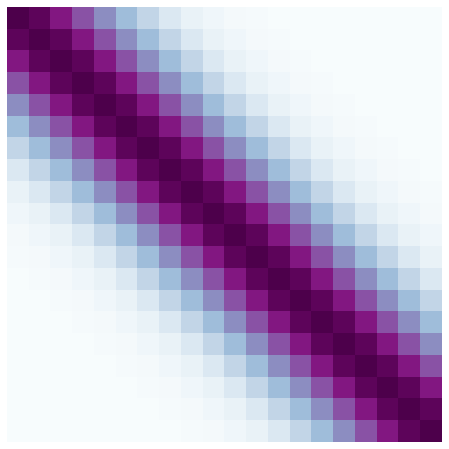

In [17]:
fig, ax = plt.subplots(figsize=(8,8))
ax.imshow(rbf_kernel(np.arange(1, 21).reshape(-1,1), None, 1.0, 5.0), cmap="BuPu", interpolation='None')
ax.axis(False)
#fig.savefig("Desktop/rbf_20", dpi=300, bbox_inches="tight")

In [18]:
import imageio
images = []
for index in range(1, 101):
    images.append(plt.imread(f"Desktop/post_sample/{index}.png"))
#imageio.mimsave(f"Desktop/post_sample.gif", images, fps=10)

ModuleNotFoundError: No module named 'imageio'

(-0.5, 1999.5, 1999.5, -0.5)

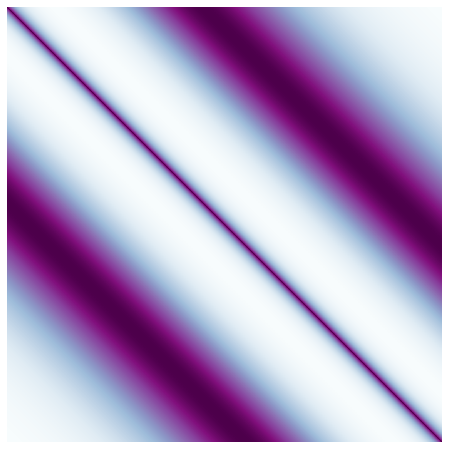

In [19]:
fig, ax = plt.subplots(figsize=(8,8))
ax.imshow(periodic_kernel(np.linspace(0,5,2000).reshape(-1,1), None, 1, 1.5, 1), cmap="BuPu", interpolation='None')
ax.axis(False)
#fig.savefig("Desktop/periodic_high", dpi=300, bbox_inches="tight")

In [20]:
K_rbf = rbf_kernel(x.reshape(-1,1), None, 1.0, 2.0)
mu = np.zeros(x.shape[0])
f_rbf = np.random.multivariate_normal(mu, K_rbf, 100)

/tmp/ipykernel_690559/118922205.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10,5))


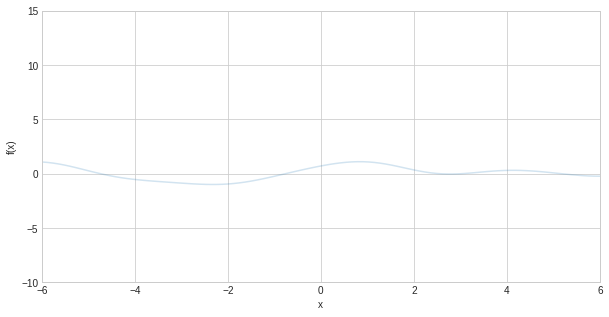

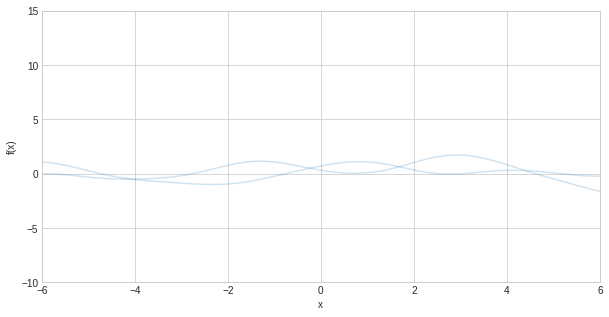

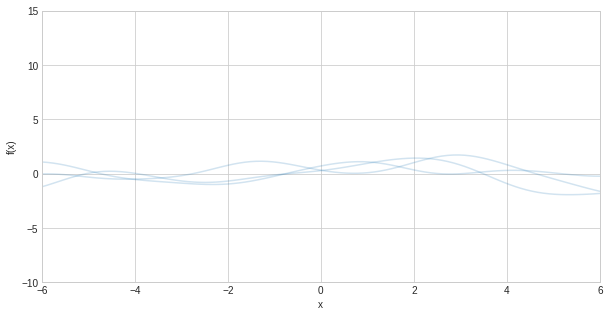

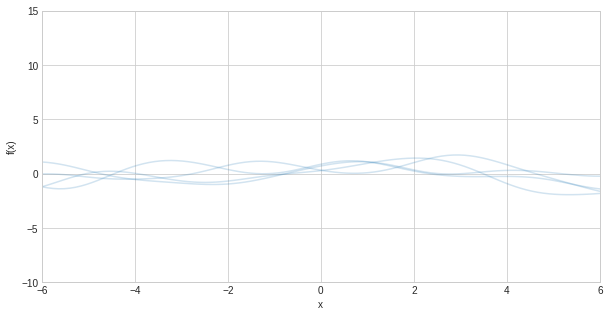

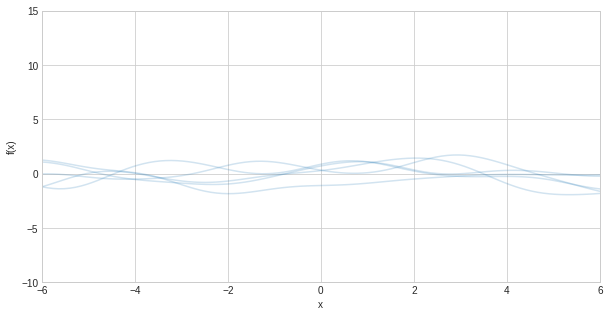

...

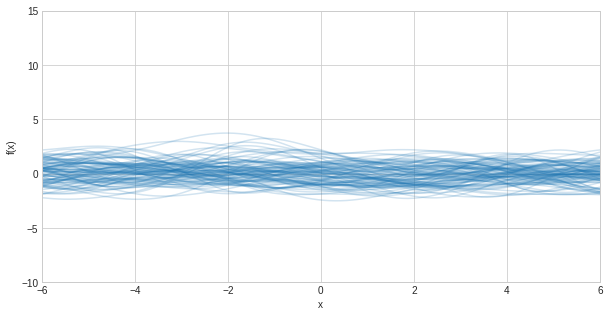

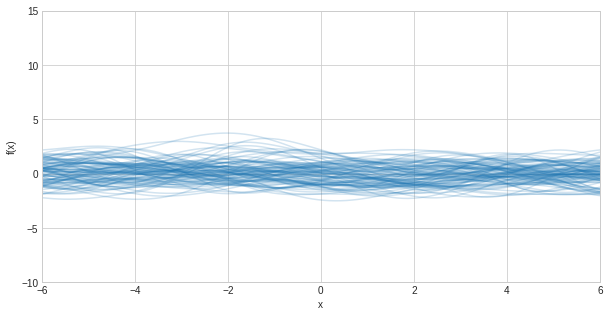

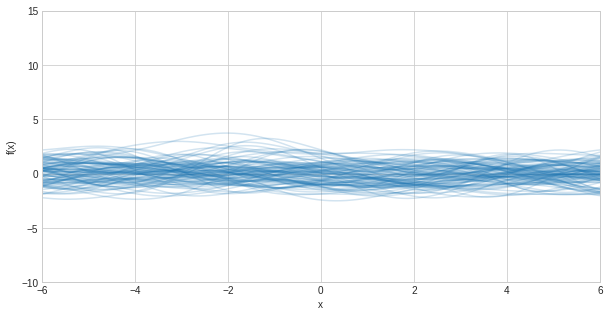

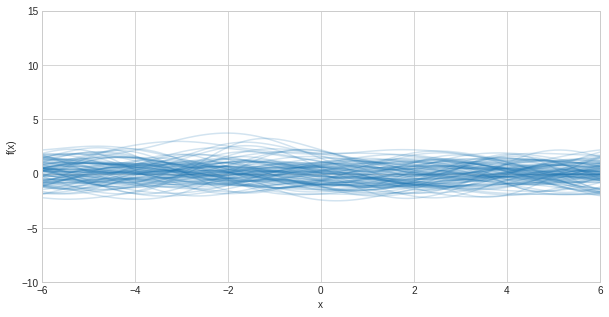

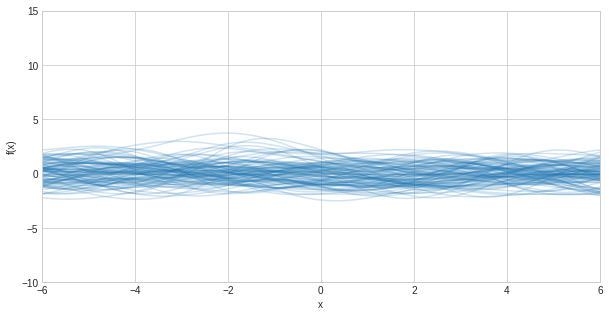

In [22]:
# plot predictions
for index in range(1,101):
    fig, ax = plt.subplots(figsize=(10,5))
    ax.plot(x, f_rbf.T[:,0:index], color='C0', alpha=0.2)
    ax.set_xlim([-6,6])
    ax.set_ylim([-10,15])
    ax.set_xlabel("x")
    ax.set_ylabel("f(x)")
    #fig.savefig(f"Desktop/prior_sample/{index}", dpi=300, bbox_inches="tight")

In [24]:

k_starX = rbf_kernel(x.reshape(-1,1), x_samp.reshape(-1,1), 3, 1)
k_xx = rbf_kernel(x_samp.reshape(-1,1), None, 3, 1)
k_starstar = rbf_kernel(x.reshape(-1,1), None, 3, 1)

mu = k_starX.dot(np.linalg.inv(k_xx)).dot(y_samp).flatten()
var = k_starstar - k_starX.dot(np.linalg.inv(k_xx)).dot(k_starX.T)

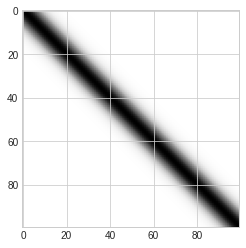

In [25]:
plt.imshow(k_starstar)

(-0.5, 99.5, 99.5, -0.5)

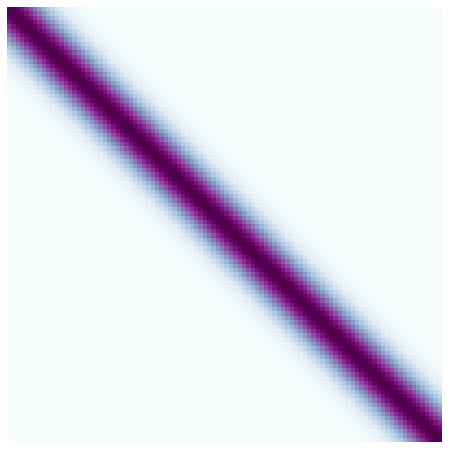

In [26]:
fig, ax = plt.subplots(figsize=(8,8))
ax.imshow(k_starstar, cmap="BuPu", interpolation='None')
ax.axis(False)
#fig.savefig("Desktop/prior", dpi=300, bbox_inches="tight")
#print(var.shape)

In [27]:
f_star = np.random.multivariate_normal(mu, var, 100)
f_star_mean = f_star.mean(axis=0)
f_star_std = f_star.std(axis=0)

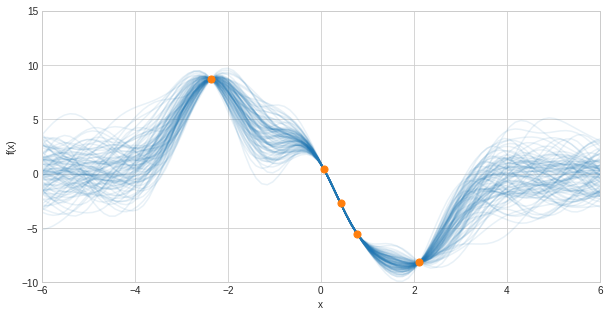

In [28]:
# plot predictions
fig, ax = plt.subplots(figsize=(10,5))
#plt.scatter(x, y, 100, 'k', 'o', zorder=100)
ax.scatter(x_samp, y_samp, s=50, c="C1", zorder=10)
ax.plot(x, f_star.T, color='C0', alpha=0.1)
ax.set_xlim([-6,6])
ax.set_ylim([-10,15])
ax.set_xlabel("x")
ax.set_ylabel("f(x)")
plt.show()

/tmp/ipykernel_690559/2587988938.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10,5))


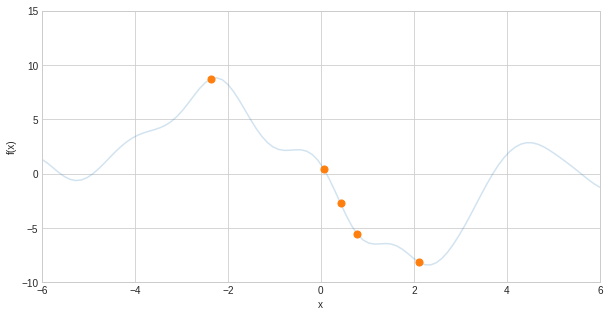

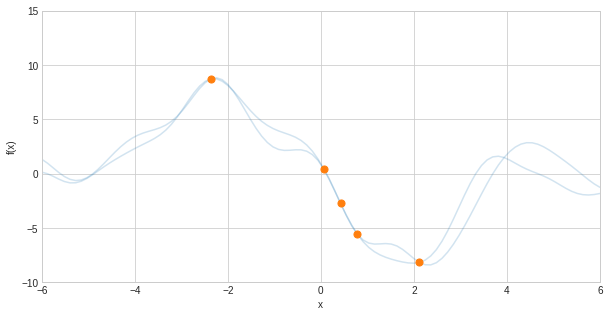

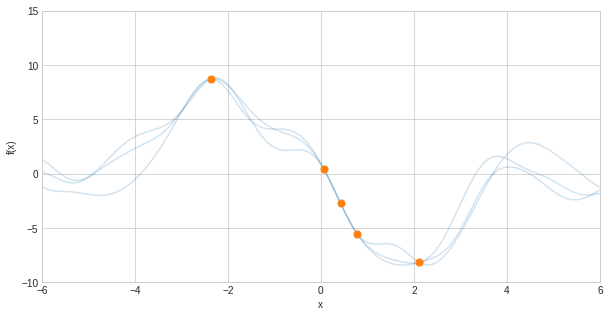

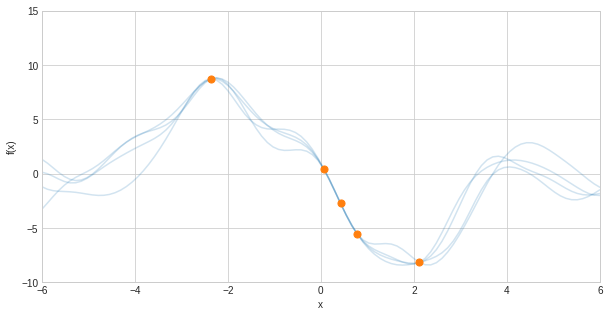

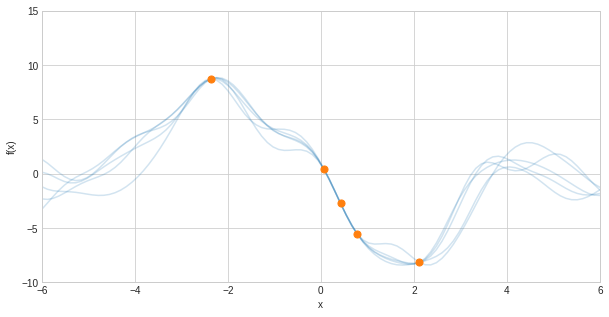

...

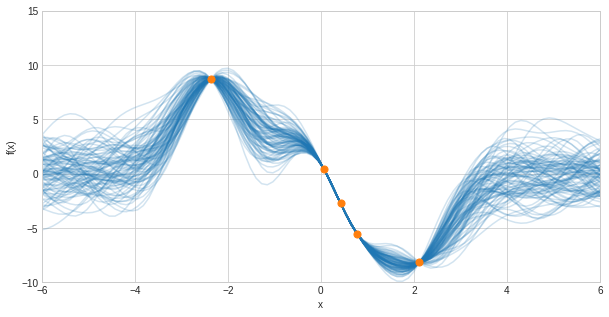

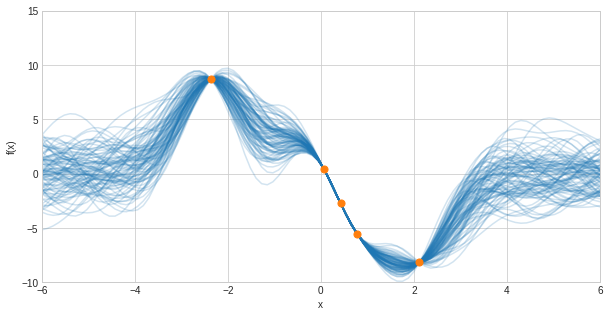

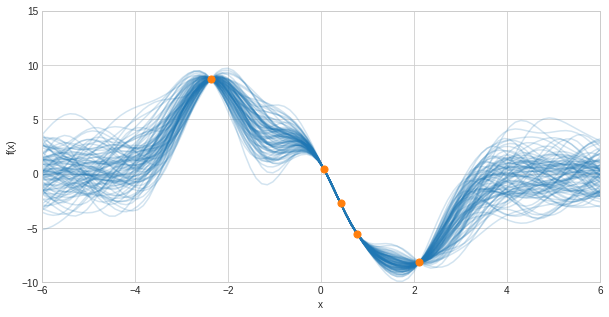

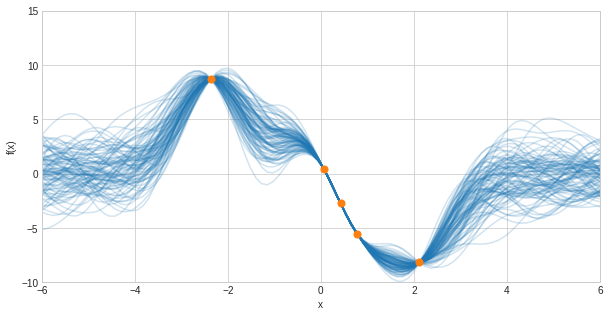

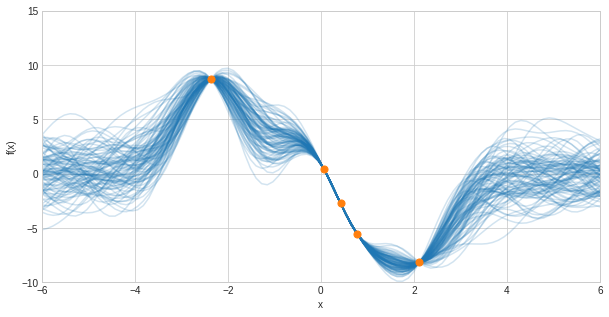

In [30]:
# plot predictions
for index in range(1,101):
    fig, ax = plt.subplots(figsize=(10,5))
    ax.plot(x, f_star.T[:,0:index], color='C0', alpha=0.2)
    ax.scatter(x_samp, y_samp, s=50, c="C1", zorder=10)
    ax.set_xlim([-6,6])
    ax.set_ylim([-10,15])
    ax.set_xlabel("x")
    ax.set_ylabel("f(x)")
    #fig.savefig(f"Desktop/post_sample/{index}", dpi=300, bbox_inches="tight")

Text(0, 0.5, 'f(x)')

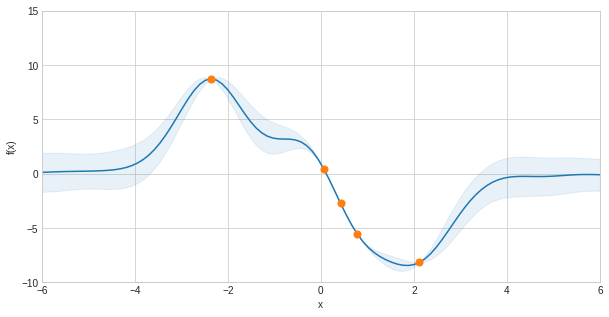

In [31]:
# plot predictions
fig, ax = plt.subplots(figsize=(10,5))
#plt.scatter(x, y, 100, 'k', 'o', zorder=100)
ax.scatter(x_samp, y_samp, s=50, c="C1", zorder=10)
ax.plot(x, f_star_mean, color='C0')
ax.fill_between(x.flatten(), f_star_mean+f_star_std, f_star_mean-f_star_std, alpha=0.1, color='C0')
ax.set_xlim([-6,6])
ax.set_ylim([-10,15])
ax.set_xlabel("x")
ax.set_ylabel("f(x)")
#fig.savefig("Desktop/data_uncert", dpi=300, bbox_inches="tight")

In [32]:
# gaussian functions
def gauss_1d(x, mu, sigma):
    norm_const = (np.sqrt(2* np.pi) * sigma)**(-1)
    exp = np.exp(-0.5 * ((x - mu) / sigma)**2)
    return norm_const * exp

def gauss_2d(x, mu, sigma):
    assert x.ndim > 1
    norm_const = ((np.sqrt(2 * np.pi))**(x.size) * np.sqrt(np.linalg.det(sigma)))**(-1)
    exp = np.exp(-0.5 * (x - mu).T @ np.linalg.inv(sigma) @ (x - mu))
    return (norm_const * exp)[0][0]

def prob_matrix_2d(mu, sigma):
    x_0_array = np.linspace(-4,10,num=100)
    x_1_array = np.linspace(-4,8,num=100)

    points = np.array(np.meshgrid(x_1_array, x_0_array)).T
    probs = np.zeros(points[:,:,0].shape)

    for x_0_index, x_0 in enumerate(x_0_array):
        for x_1_index, x_1 in enumerate(x_1_array):
            probs[x_1_index, x_0_index] = gauss_2d(np.array([[x_0, x_1]]).T, mu, sigma)

    return probs


(-0.5, 99.5, -0.5, 99.5)

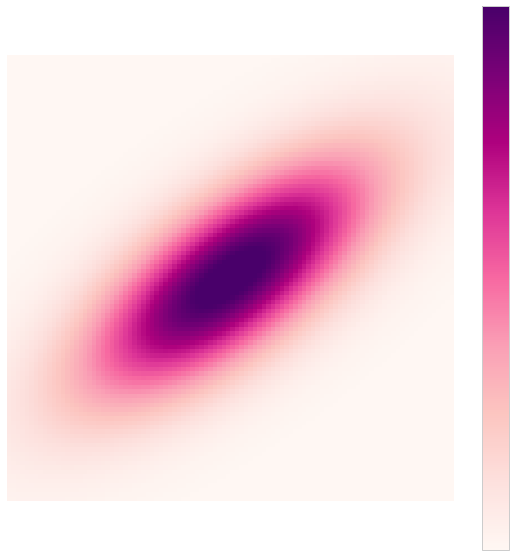

In [33]:

# investigate multivariate gaussian (2d)
mu = np.array([[3, 2]]).T
sigma = np.array([[10,5],[5,5]])

probs = prob_matrix_2d(mu, sigma)


fig, ax = plt.subplots(figsize=[10,10])
imshow = ax.imshow(probs, origin="lower",cmap="RdPu", vmin=0, vmax=0.03)
cbar = plt.colorbar(imshow)
cbar.set_ticks([])
plt.axis('off')
#fig.savefig('covar_matrix.png', dpi=300, bbox_inches="tight")